# NEOSSat Tutorial - Processing & Analytics

**Tutorial**: This tutorial demonstrates how to download and load FITS files from CADC, perform cursory processing of imagery, and analysis of streaklets and object motion in Python.<br>

This tutorial uses imagery data from the NEOSSat mission.<br>

**Mission & Instrument**: [NEOSSat](https://www.asc-csa.gc.ca/eng/satellites/neossat/) <br>

**Mission Objectives**: 
* Space Situational Awareness: Near-Earth Objects (asteroids, space debris)
* Astronomical Target: celestial objects (comets, nebulas, galaxies, exoplanets)


**System Requirements**: Python 3.9+ (tested)<br>

**Tutorial Level**: Intermediate <br>

***
**MIT License** <br>
Copyright (c) His Majesty the King in Right of Canada, as represented by the Canadian Space Agency, 2024. <br>
Droit d’auteur (c) Sa Majesté le Roi du chef du Canada, représentée par l'Agence Spatiale Canadienne, 2024.<br>

For more information, please refer to the *License.txt* file. 

***
**Background Information** <br>
The [NEOSSat](https://www.asc-csa.gc.ca/eng/satellites/neossat/) mission launched on February 25, 2013, is the world's first satellite-based telescope dedicated for near-earth-object detection and tracking. 

As part of Canada’s efforts to observe and track asteroids, comets, satellites, and space debris, this microsatellite, only the size of a suitcase is a powerful observation platform. 

Operating at an altitude of approximately 800 kilometers, this microsatellite orbits the Earth every 100 minutes and provides continuous monitoring of near-Earth objects. NEOSSat uses advanced reaction wheel technology, first demonstrated through the [Microvariability and Oscillations of Stars (MOST)](https://www.asc-csa.gc.ca/eng/satellites/most/) satellite allowing it to scan regions of space near the Sun, helping to identify asteroids and comets that may pass close to Earth.

As part of Canada's commitment to space safety, NEOSSat is involved in tracking space debris, providing essential data on objects that are difficult to observe  by ground-based telescopes. The mission is jointly funded by the Canadian Space Agency (CSA) and Defence Research and Development Canada (DRDC). NEOSSat continues to advance Canada’s role in space exploration and safety through its ongoing contributions to asteroid tracking, space debris monitoring, and exoplanet research.


***
**Further Reading** <br>
* **Title:** [NEOSSat FITS Image User's Guide](https://data.asc-csa.gc.ca/users/OpenData_DonneesOuvertes/pub/NEOSSAT/Supporting%20Documents/CSA-NEOSSAT-MAN-0002_FITS_IMAGE_UGUIDE-v4-00.pdf)
    * **Description:** A valuable document that contains full, detailed information regarding the NEOSSat FITS format, keyword semantics, and available data within the FITS file. 
<p></p>

* **Title:** [The NEOSSat Experience: 5 Years in the Life of Canada’s Space Surveillance Telescope](https://data.asc-csa.gc.ca/users/OpenData_DonneesOuvertes/pub/NEOSSAT/Supporting%20Documents/NEOSSat%20Experience-v1.5.pdf)
    * **Description:** A useful summary paper regarding the developments, challenges and success of the NEOSSat program. 
<p></p>

* **Title:** [Key Findings from the NEOSSat Space-Based
SSA Microsatellite Mission](https://cradpdf.drdc-rddc.gc.ca/PDFS/unc326/p808033_A1b.pdf) 
    * **Description:** Another useful summary paper regarding the developments, challenges and success of the NEOSSat program.
<p></p>

* **Title:** [Space Surveillance from a Microsatellite: Metric observation processing from NEOSSat](https://espace.rmc.ca/jspui/handle/11264/1364)
    * **Description:** A thesis regarding near-earth-surveilance using NEOSSat, including in-depth processing information and algorithm development. 


## Libraries Required
* Below we will intialize several libraries required for the tutorial.  

In [1]:
import os
import requests
import re
import imageio
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from astropy.io import fits
from astropy.time import Time
from astropy.coordinates import SkyCoord
import astropy.units as u
from astroquery.cadc import Cadc
from scipy.ndimage import gaussian_filter, median_filter
from skimage.feature import canny
from skimage.transform import hough_line, hough_line_peaks
from skimage.morphology import (
    binary_closing,
    binary_opening,
    remove_small_objects,
    binary_dilation,
    disk,
)
from skimage.draw import line as draw_line
from pylsd.lsd import lsd
from IPython.display import Image

## Section A - Acquiring NEOSSat Imagery
* Information about the Open Data Portal
* Information about Canadian Astronomy Data Center
* Searching, filtering and downloading of NEOSSat Imagery

To acquire NEOSSat images, you can access data from two main sources: the Canadian Space Agency (CSA) Open Data Portal and the Canadian Astronomy Data Centre (CADC). 

The CSA offers NEOSSat data through its [Open Data Portal](https://open.canada.ca/data/en/dataset/9ae3e718-8b6d-40b7-8aa4-858f00e84b30), alongside other helpful resources. This data can then be downloaded manually or through File Transfer Protocol (FTP), and is primarily organized by date and time. For additional information in accessing through FTP please see the following [tutorial](https://github.com/asc-csa/NEOSSAT_Tutorial/blob/main/01_%20Extracting%20Data%20and%20Visualization.ipynb).


Alternatively, the [CADC](https://www.cadc-ccda.hia-iha.nrc-cnrc.gc.ca/en/neossat/) provides NEOSSat data with advanced search capabilities, including date-time, target object, acquisition parameters and more. This data can be searched using their [platform](https://www.cadc-ccda.hia-iha.nrc-cnrc.gc.ca/en/search/?collection=NEOSSAT&noexec=true), or you can access it through [astroquery](https://astroquery.readthedocs.io/en/latest/) a popular python library for querying and accessing astronomical data. CADC provides several helpful [tutorials](https://github.com/opencadc/notebook-tutorials/blob/master/astroquery_example_kbos.ipynb) to help better understand astroquery's integration with CADC. We will focus on using astroquery for downloading and accessing data in this tutorial. 

First, using [Astronomical Data Query Language](https://www.ivoa.net/documents/ADQL/20180112/PR-ADQL-2.1-20180112.html) we will develop a function to create queries to be used in astroquery. ADQL is an SQL like language allowing for structured search of astronomical databases. 

In [2]:
def construct_adql_query(start_date, end_date, collection='NEOSSAT', calibration_level='2'):

    start_mjd = Time(start_date).mjd
    end_mjd = Time(end_date).mjd

    # Construct the ADQL query
    adql_query = f"""
    SELECT * FROM caom2.Plane AS Plane
    JOIN caom2.Observation AS Observation ON Plane.obsID = Observation.obsID
    WHERE (
        INTERSECTS(
            INTERVAL({start_mjd}, {end_mjd}),
            Plane.time_bounds_samples
        ) = 1
        AND Observation.collection = '{collection}'
        AND Plane.calibrationLevel = '{calibration_level}'
        AND (
            Plane.quality_flag IS NULL OR Plane.quality_flag != 'junk'
        )
    )
    """
    return adql_query


In [3]:
def search_neossat_data_with_adql(adql_query):
    # Execute the query using exec_sync
    cadc = Cadc()
    results = cadc.exec_sync(adql_query) 
    return results


To provide ease of access, we have combined the above functions into a date-time search function below. 

In [5]:
def search_neossat_data(start_date, end_date):
    # Convert start_date and end_date to MJD (Modified Julian Date)
    start_mjd = Time(start_date).mjd
    end_mjd = Time(end_date).mjd

    # Construct the ADQL query
    adql_query = f"""
    SELECT * FROM caom2.Plane AS Plane
    JOIN caom2.Observation AS Observation ON Plane.obsID = Observation.obsID
    WHERE (
        INTERSECTS(
            INTERVAL({start_mjd}, {end_mjd}),
            Plane.time_bounds_samples
        ) = 1
        AND Observation.collection = 'NEOSSAT'
        AND Plane.calibrationLevel = '2'
        AND (
            Plane.quality_flag IS NULL OR Plane.quality_flag != 'junk'
        )
    )
    """

    # Execute the query using exec_sync
    cadc = Cadc()
    results = cadc.exec_sync(adql_query)

    return results


In [6]:
# Define the date range for your search in the yyyy-mm-dd format
start_date = '2023-12-05' 
end_date = '2023-12-06'

# Search for NEOSSat data within the date range
results_table = search_neossat_data(start_date, end_date)
print(f"Number of matching observations: {len(results_table)}")


Number of matching observations: 98


The results will include information such as exposure times, observation start times, and filter properties. You can filter the data further based on your needs by using these fields in the returned table. Typical filters may include object name, instrument keywords, or exposure time. Some useful properties include: 

* **productID**
    * Parameters include cor, cord, clean and other to select for level of processing applied (covered in detail later on).
* **instrument_keywords**
    * 06-ST_ACQUIRE: General tracking of celestial targets.
    * 16-FINE_POINT: Precise tracking of fast-moving celestial targets. 
* **type**
    * Object or dark image.
* **target_name**
    * Name of the celestial target tracked. 
* **time_exposure**
    * Time the shutter was open and sensor was exposed, which corresponds to the imaging time. 


In [7]:
# Optionally, perform additional filtering of results based on additional criteria
# For example, only select observations with exposure time greater than 105 seconds and using fine-point tracking 
results_table = results_table[(results_table['instrument_keywords'] == '16-FINE_POINT') & (results_table['time_exposure'] > 105)]

# Taking only the first five records
filtered_results = results_table[:5]

# Displaying the first result
filtered_results[:1]


publisherID,planeURI,creatorID,metaReadGroups,dataReadGroups,calibrationLevel,provenance_keywords,provenance_inputs,metrics_sourceNumberDensity,metrics_background,metrics_backgroundStddev,metrics_fluxDensityLimit,metrics_magLimit,position_bounds,position_bounds_samples,position_bounds_size,position_resolution,position_sampleSize,obsID,position_dimension_naxis1,position_dimension_naxis2,position_timeDependent,energy_bounds_samples,energy_bounds_lower,energy_bounds_upper,energy_bounds_width,energy_dimension,energy_resolvingPower,energy_sampleSize,energy_freqWidth,energy_freqSampleSize,energy_restwav,time_bounds_samples,time_bounds_lower,time_bounds_upper,time_bounds_width,time_dimension,time_resolution,time_sampleSize,time_exposure,polarization_dimension,custom_bounds_samples,custom_bounds_lower,custom_bounds_upper,custom_bounds_width,custom_dimension,metaProducer,metaChecksum,accMetaChecksum,planeID,productID,metaRelease,dataRelease,dataProductType,provenance_name,provenance_version,provenance_reference,provenance_producer,provenance_project,provenance_runID,provenance_lastExecuted,observable_ucd,quality_flag,position_resolutionBounds,energy_bounds,energy_resolvingPowerBounds,energy_emBand,energy_energyBands,energy_bandpassName,energy_transition_species,energy_transition_transition,time_bounds,time_resolutionBounds,polarization_states,custom_ctype,custom_bounds,lastModified,maxLastModified,observationURI,sequenceNumber,metaReadGroups2,proposal_keywords,target_standard,target_redshift,target_moving,target_keywords,targetPosition_equinox,targetPosition_coordinates_cval1,targetPosition_coordinates_cval2,telescope_geoLocationX,telescope_geoLocationY,telescope_geoLocationZ,telescope_keywords,instrument_keywords,environment_seeing,environment_humidity,environment_elevation,environment_tau,environment_wavelengthTau,environment_ambientTemp,environment_photometric,members,typeCode,metaProducer2,metaChecksum2,accMetaChecksum2,obsID2,collection,observationID,algorithm_name,type,intent,metaRelease2,proposal_id,proposal_pi,proposal_project,proposal_title,target_name,target_targetID,target_type,targetPosition_coordsys,telescope_name,requirements_flag,instrument_name,lastModified2,maxLastModified2
,,,,,,,,1 / deg2,Jy / pix,Jy / pix,Jy,,deg,deg,deg,arcsec,arcsec,,,,,m,m,m,m,,,m,Hz,Hz,m,d,d,d,d,,d,d,s,,,,,,,,,,,,,,,,,,,,,,,,arcsec,m,,,,,,,d,d,,,,,,,,,,,,,,,deg,deg,,,,,,arcsec,,deg,,m,C,,,,,,,,,,,,,,,,,,,,,,,,,,
object,object,object,object,object,int32,object,object,float64,float64,float64,float64,float64,object,object,float64,float64,float64,str36,int64,int64,int32,object,float64,float64,float64,int64,float64,float64,float64,float64,float64,object,float64,float64,float64,int64,float64,float64,float64,int64,object,float64,float64,float64,int64,object,object,object,str36,str64,str23,str23,str128,str128,str32,str256,str128,str256,str64,str23,str64,str16,float64[2],float64[2],float64[2],str32,str32,str32,str32,str32,float64[2],float64[2],str32,str32,float64[2],str23,str23,object,int32,object,object,int32,float64,int32,object,float64,float64,float64,float64,float64,float64,object,object,float64,float64,float64,float64,float64,float64,int32,object,str1,object,object,object,str36,str32,str128,str32,str32,str32,str23,str128,str128,str32,str256,str32,str32,str32,str16,str32,str16,str32,str23,str23
ivo://cadc.nrc.ca/NEOSSAT?2023339134953/cor,caom:NEOSSAT/2023339134953/cor,,,,2,,,--,--,--,--,--,polygon 198.25062213017648 -39.958320811679755 199.11476800963055 -39.42357664967602 199.8151139413822 -40.08124744410364 198.94809586006082 -40.62119167277373,[198.94809586006085 -40.62119167277373 199.81511394138226\n -40.08124744410363 199.11476800963058 -39.423576649676015\n 198.25062213017654 -39.958320811679755],1.2043985307714247,--,3.0000000000000004,f399ae80-b328-45e9-a88e-0f8391e0d6dd,1024,1020,--,[[4e-07 9e-07]],4e-07,9e-07,5e-07,1,1.2,5e-07,416378472222222.2,416378472222222.3,--,[[60283.576314756945 60283.57756505903]],60283.576314756945,60283.577565059

### Downloading NEOSSat FITS Files

To download NEOSSat data from the CADC, we will use astroquery.cadc.Cadc to query the CADC directly. 

The downloading process may take a while depending on the number of images and network speeds. To avoid re-downloading files, make sure to keep them organized in a designated folder on your computer. You can specify the folder name during the download process as shown in the code below:

In [8]:
def download_neossat_data(results_table, folder_name='neossat_data'):
    # Get the current working directory
    current_dir = os.getcwd()
    output_folder = os.path.join(current_dir, folder_name)

    # Create the folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    cadc = Cadc()

    # Get a list of data URLs based on the results table
    data_urls = cadc.get_data_urls(results_table)

    filenames = []

    for url in data_urls:
        # Extract the filename from the URL
        filename = os.path.basename(url.split('?')[0])
        filepath = os.path.join(output_folder, filename)
        response = requests.get(url, stream=True)
        if response.status_code == 200:
            with open(filepath, 'wb') as f:
                for chunk in response.iter_content(chunk_size=8192):
                    f.write(chunk)
            filenames.append(filepath)
            print(f"Downloaded {filename}")
        else:
            print(f"Failed to download {url}")

    return filenames


In [ ]:
# Download the data to a local folder
output_folder = 'neossat_example_data'
downloaded_files = download_neossat_data(filtered_results, output_folder)
print(f"Downloaded {len(downloaded_files)} files to {output_folder}")


## Section B - Initial Visualization & Exploration
* Initial Data Exploration
* Accessing Images

When working with NEOSSat FITS images, it's important to understand the structure of the FITS files. NEOSSat images use the [FITS (Flexible Image Transport System)](https://fits.gsfc.nasa.gov/fits_primer.html) format, which contains a primary header and optional extensions with metadata like raw telemetry data. Each FITS image from NEOSSat is typically a 1024x1024 pixel matrix, with each pixel corresponding to approximately 3 arcseconds in the field of view. NEOSSat FITS files also include metadata such as the exposure time, filter, telescope pointing, and CCD readout settings. These files can be opened and explored using Python libraries like astropy or other image viewing libraries.

NEOSSat images also follow a strict naming convention based on the processing level and type of image. The filenames include indicators for raw or cleaned images, time of acquisition and instrument type.

**For example:**
* NEOS_"detector"_"timestamp".fits
    * Where "detector" is either “SCI” (for Science CCD) or “ST” (for Star Tracker CCD) and where
    "timestamp" follows the convention “YYYYDDDhhmmss” corresponding to the start of exposure in
    Coordinated Universal Time (UTC).
    * Cleaned images will have the suffix _cor.fits for Python-cleaned images, and _clean.fits for Java-cleaned images.
    * Cleaned images with dark image subtraction will have the suffix of _cord.fits. 

More details on the naming conventions and full header list is available in the [FITS Image User’s Guide](https://data.asc-csa.gc.ca/users/OpenData_DonneesOuvertes/pub/NEOSSAT/Supporting%20Documents/CSA-NEOSSAT-MAN-0002_FITS_IMAGE_UGUIDE-v4-00.pdf).

In [9]:
def read_fits_data(filename):
    data = fits.getdata(filename)
    data = data.astype(np.float64)
    return data


In [10]:
fits_file = 'neossat_example_data/NEOS_SCI_2023339134953_cor.fits'  # Replace with the path to your FITS file
example_image = read_fits_data(fits_file)


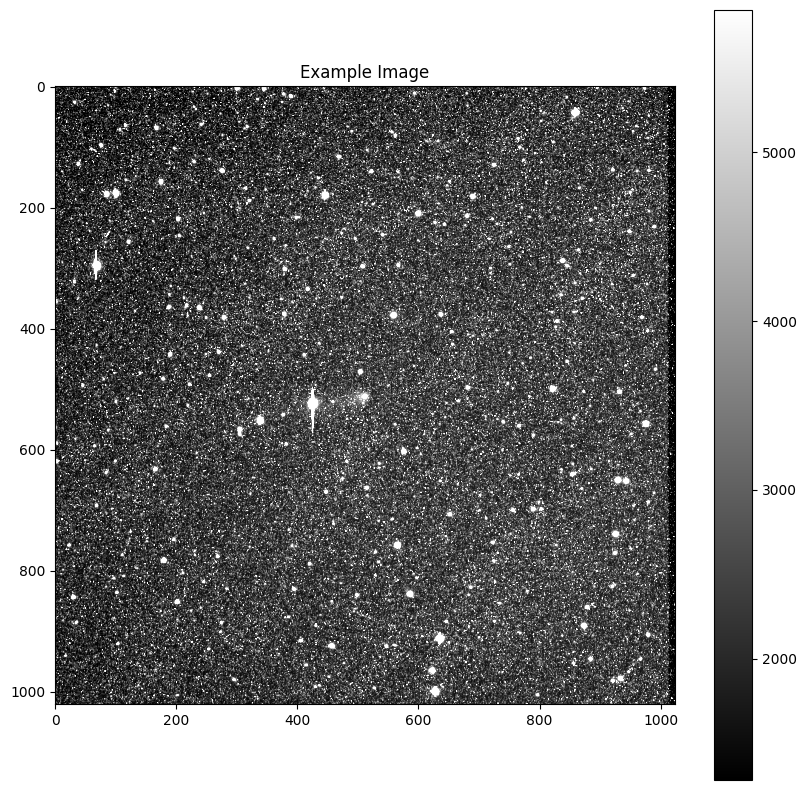

In [11]:
plt.figure(figsize=(10, 10))
vmin, vmax = np.percentile(example_image, [5, 95])
plt.imshow(example_image, cmap='gray', vmin=vmin, vmax=vmax)
plt.title('Example Image')
plt.colorbar()
plt.show()

In [12]:
# Access the fits file header 
hdul = fits.open(fits_file)

# Print the header of the primary HDU (Header Data Unit)
print(hdul[0].header[:5])

# Close the FITS file after processing
hdul.close()

SIMPLE  =                    T / FITS STANDARD                                  BITPIX  =                  -32 / Bits per pixel                                 NAXIS   =                    2 / Number of axis                                 NAXIS1  =                 1024 / Size of image - Xaxis                          NAXIS2  =                 1020 / Size of image - Yaxis                          END                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

## Section C - Pre-Processing of Images
* Applying Coarse Overscan Correction
* Process for Developing Dark Images

Before analyzing NEOSSat FITS images, you may need to perform several pre-processing steps if the images do not contain either a _cor, _cord or _clean suffix. 

These steps and others help to ensure that the image data is clean and free of artifacts and [hot pixels](https://www.astropy.org/ccd-reduction-and-photometry-guide/v/dev/notebooks/08-01-Identifying-hot-pixels.html). One common step is overscan correction, which removes extra pixel values outside the CCD area that don’t correspond to actual image data. Additionally, dark frame subtraction and flat-field correction are typically necessary to account for noise and variations in pixel sensitivity across the detector.

For advanced pre-processing and image analysis it is highly recommended you explore the [NEOSSat Library](https://github.com/jasonfrowe/neossat/tree/master) developed by Jason Rowe. Example utilization of the library is available [here](https://github.com/jasonfrowe/neossat/blob/master/notebooks/Cleaning%20NEOSSat%20Photometry.ipynb).

In [13]:
def get_image_dimensions(filename, overscan_width=50):
    header = fits.getheader(filename)
    x_size = header['NAXIS1']
    y_size = header['NAXIS2']
    overscan_start_col = x_size - overscan_width
    return x_size, y_size, overscan_start_col


In [14]:
def overscan_correction(science_data, overscan_region):
    overscan_median = np.median(overscan_region, axis=1)
    corrected_data = science_data - overscan_median[:, np.newaxis]
    return corrected_data

In [15]:
def create_master_dark(dark_frames_directory):
    dark_files = [f for f in os.listdir(dark_frames_directory) if f.endswith('.fits')]
    dark_data_list = []

    for filename in tqdm(dark_files, desc='Processing dark frames'):
        input_path = os.path.join(dark_frames_directory, filename)
        data = read_fits_data(input_path)
        x_size, y_size, overscan_start_col = get_image_dimensions(input_path)
        science_data = data[:, :overscan_start_col]
        overscan_region = data[:, overscan_start_col:]
        corrected_dark = overscan_correction(science_data, overscan_region)
        dark_data_list.append(corrected_dark)

    # Stack dark frames using median to reduce noise and reject outliers
    dark_stack = np.array(dark_data_list)
    master_dark = np.median(dark_stack, axis=0)
    return master_dark


In [16]:
def apply_dark_correction(overscan_corrected_directory, master_dark, output_directory):
    cor_files = [f for f in os.listdir(overscan_corrected_directory) if f.endswith('_cor.fits')]

    for filename in tqdm(cor_files, desc='Applying dark correction'):
        input_path = os.path.join(overscan_corrected_directory, filename)

        # Modify the output filename to include '_cord'
        base_filename = os.path.splitext(filename)[0]
        new_filename = base_filename.replace('_cor', '_cord') + '.fits'
        output_path = os.path.join(output_directory, new_filename)

        # Read the overscan-corrected data
        data = read_fits_data(input_path)

        # Ensure data and master_dark have the same shape
        if data.shape != master_dark.shape:
            print(f"Warning: Shape mismatch between data {data.shape} and master dark {master_dark.shape}")
            # Crop or pad as necessary (here we crop to the smallest shape)
            min_rows = min(data.shape[0], master_dark.shape[0])
            min_cols = min(data.shape[1], master_dark.shape[1])
            data = data[:min_rows, :min_cols]
            master_dark_cropped = master_dark[:min_rows, :min_cols]
        else:
            master_dark_cropped = master_dark

        # Subtract master dark
        dark_corrected_data = data - master_dark_cropped

        # Save the dark-corrected image
        header = fits.getheader(input_path)
        header.add_history('Dark correction applied.')
        hdu = fits.PrimaryHDU(dark_corrected_data, header=header)
        hdu.writeto(output_path, overwrite=True)


In [17]:
# Define directories; they will use your current working directory
input_directory = 'neossat_example_data' # Replace with your raw images directory
output_directory = 'neossat_example_results'  # Replace with your processed images directory
dark_frames_directory = 'dark_test'     # Replace with your dark frames directory

# Ensure the output directory exists
if not os.path.exists(output_directory):
    os.makedirs(output_directory)


In [18]:
# List FITS files
fits_files = [f for f in os.listdir(input_directory) if f.endswith('.fits')]

# Overscan correction
print("Starting overscan correction...")
for filename in tqdm(fits_files, desc='Processing images'):
    input_path = os.path.join(input_directory, filename)

    # Modify the output filename to include '_cor' before the extension
    base_filename = os.path.splitext(filename)[0]
    new_filename = base_filename + '_cor.fits'
    output_path = os.path.join(output_directory, new_filename)

    # Read the image data
    data = read_fits_data(input_path)
    x_size, y_size, overscan_start_col = get_image_dimensions(input_path)
    science_data = data[:, :overscan_start_col]
    overscan_region = data[:, overscan_start_col:]
    corrected_data = overscan_correction(science_data, overscan_region)

    # Save the corrected image
    header = fits.getheader(input_path)
    header.add_history('Overscan correction applied.')
    hdu = fits.PrimaryHDU(corrected_data, header=header)
    hdu.writeto(output_path, overwrite=True)
print("Overscan correction completed.")


Starting overscan correction...


Processing images: 100%|█████████████████████████████████████████████████████████████████| 5/5 [00:01<00:00,  4.17it/s]

Overscan correction completed.


In [19]:
# Create master dark frame
print("Creating master dark frame...")
master_dark = create_master_dark(dark_frames_directory)
master_dark_path = os.path.join(output_directory, 'master_dark.fits')
hdu = fits.PrimaryHDU(master_dark)
hdu.writeto(master_dark_path, overwrite=True)
print("Master dark frame created.")


Creating master dark frame...


Processing dark frames: 100%|████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 19.93it/s]


Master dark frame created.


In [20]:
# Apply dark correction to overscan-corrected images
print("Applying dark correction...")
apply_dark_correction(output_directory, master_dark, output_directory)
print("Dark correction completed.")


Applying dark correction...


Applying dark correction:   0%|                                                                  | 0/5 [00:00<?, ?it/s]

Applying dark correction:  40%|███████████████████████▏                                  | 2/5 [00:00<00:00,  4.07it/s]

Applying dark correction:  60%|██████████████████████████████████▊                       | 3/5 [00:00<00:00,  4.29it/s]

Applying dark correction:  80%|██████████████████████████████████████████████▍           | 4/5 [00:00<00:00,  4.51it/s]

Applying dark correction: 100%|██████████████████████████████████████████████████████████| 5/5 [00:01<00:00,  4.35it/s]

Dark correction completed.


In [21]:
# Specify image type ('_cor' for overscan-corrected, '_cord' for dark-corrected, or '_clean' for alternative overscan-corrected)
image_type = '_cord'

# List images of the specified type
image_files = [f for f in os.listdir(output_directory) if f.endswith(f'{image_type}.fits')]
image_files.sort()  # Sort the list for consistency

print(f"Found {len(image_files)} images of type {image_type}")


Found 5 images of type _cord


Next, we will apply image stacking, a common technique in image processing to reduce background noise and improve overall image quality. Stacking multiple raw images results in a final image with significantly better clarity than any single raw image.

In [22]:
def stack_images(image_files, image_directory):
    image_data_list = []
    for filename in tqdm(image_files, desc='Reading images'):
        filepath = os.path.join(image_directory, filename)
        data = read_fits_data(filepath)
        image_data_list.append(data)
    
    image_shape = image_data_list[0].shape
    stacked_image = np.median(np.array(image_data_list), axis=0)
    return stacked_image, image_shape


In [23]:
# Stack the images
print('Stacking images...')
stacked_image, image_shape = stack_images(image_files, output_directory)


Stacking images...


Reading images: 100%|████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 19.39it/s]


In [24]:
# Save the stacked image
stacked_image_path = os.path.join(output_directory, f'stacked_image{image_type}.fits')
hdu = fits.PrimaryHDU(stacked_image)
hdu.writeto(stacked_image_path, overwrite=True)
print(f'Stacked image saved to {stacked_image_path}')


Stacked image saved to neossat_example_results\stacked_image_cord.fits


## Section D - Image Analysis & Detection
* Line Segment Detection for Detecting Streaklets
* Motion Detection for Detection Near-Earth-Objects

This section will guide you through the process of analyzing NEOSSat imagery, focusing on motion streaklet detection within image frames. NEOSSat's high-resolution images are ideal for detecting faint objects, and the star-tracking mode provides additional information about object motion relative to the star field. Detection of moving objects can be especially important for identifying Near-Earth objects (NEOs) or space debris.

One of the first steps in detecting objects in astronomical images is to apply edge detection to highlight potential objects of interest. The [LSD: Line Segment Detector](http://www.ipol.im/pub/art/2012/gjmr-lsd/) is particularly useful in this case, as it can effectively identify boundaries even in noisy images like those captured in space environments. Additional documentation on the implementation of this algorithm in python is available [here](https://github.com/primetang/pylsd?tab=readme-ov-file). 



In [25]:
def detect_streaklets(image_data):
    # Preprocess the image
    smoothed = gaussian_filter(image_data, sigma=1)
    normalized = (smoothed - np.min(smoothed)) / (np.max(smoothed) - np.min(smoothed))
    img_uint8 = (normalized * 255).astype(np.uint8)

    # Apply LSD
    lines = lsd(img_uint8)

    # Create an empty mask
    streaklet_mask = np.zeros_like(img_uint8, dtype=bool)

    # Define minimum length for line segments
    min_length = 10  # Adjust as needed

    for line in lines:
        x0, y0, x1, y1, width = line
        length = np.hypot(x1 - x0, y1 - y0)
        if length >= min_length:
            rr, cc = draw_line(int(y0), int(x0), int(y1), int(x1))
            rr = np.clip(rr, 0, img_uint8.shape[0] - 1)
            cc = np.clip(cc, 0, img_uint8.shape[1] - 1)
            streaklet_mask[rr, cc] = True

    # Morphological operations to clean up the mask
    streaklet_mask = binary_dilation(streaklet_mask, footprint=disk(1))
    streaklet_mask = remove_small_objects(streaklet_mask, min_size=50)

    return streaklet_mask


NEOSSat images are often taken in sequences that allow for the detection of moving objects by comparing changes across frames. You can detect moving objects by calculating the difference between consecutive frames to highlight changes that could indicate object movement.

Here’s an example of how to calculate the difference between two frames to detect motion:

In [26]:
def detect_moving_objects(image_files, image_directory, image_shape):
    num_images = len(image_files)
    data_cube = np.zeros((num_images, *image_shape))

    for idx, filename in enumerate(tqdm(image_files, desc='Loading images for moving object detection')):
        filepath = os.path.join(image_directory, filename)
        data_cube[idx] = read_fits_data(filepath)

    # Calculate the median image to use as a reference (background)
    median_image = np.median(data_cube, axis=0)

    # Subtract the median image from each frame to detect changes
    difference_cube = data_cube - median_image

    # Apply threshold to detect significant changes
    threshold = np.std(difference_cube) * 3  # Adjust the factor as needed
    moving_objects_mask = np.max(difference_cube > threshold, axis=0)

    # Clean up the mask
    moving_objects_mask = binary_opening(moving_objects_mask, footprint=np.ones((3, 3)))
    moving_objects_mask = remove_small_objects(moving_objects_mask, min_size=20)

    return moving_objects_mask


In [27]:
# Detect streaklets in individual images
print('Detecting streaklets in individual images...')
streaklet_masks = []
for filename in tqdm(image_files, desc='Detecting streaklets'):
    filepath = os.path.join(output_directory, filename)
    data = read_fits_data(filepath)
    streaklet_mask = detect_streaklets(data)
    streaklet_masks.append(streaklet_mask)
    # Save the streaklet mask
    mask_filename = os.path.splitext(filename)[0] + '_streaklet_mask.fits'
    mask_path = os.path.join(output_directory, mask_filename)
    hdu = fits.PrimaryHDU(streaklet_mask.astype(np.uint8))
    hdu.writeto(mask_path, overwrite=True)
print('Streaklet detection completed.')


Detecting streaklets in individual images...


Detecting streaklets: 100%|██████████████████████████████████████████████████████████████| 5/5 [00:02<00:00,  2.25it/s]

Streaklet detection completed.


In [28]:
# Detect moving objects across images
print('Detecting moving objects across images...')
moving_objects_mask = detect_moving_objects(image_files, output_directory, image_shape)
# Save the moving objects mask
moving_objects_mask_path = os.path.join(output_directory, f'moving_objects_mask{image_type}.fits')
hdu = fits.PrimaryHDU(moving_objects_mask.astype(np.uint8))
hdu.writeto(moving_objects_mask_path, overwrite=True)
print(f'Moving objects mask saved to {moving_objects_mask_path}')


Detecting moving objects across images...


Loading images for moving object detection: 100%|████████████████████████████████████████| 5/5 [00:00<00:00, 17.67it/s]


Moving objects mask saved to neossat_example_results\moving_objects_mask_cord.fits


This technique can be further enhanced by applying filters or thresholding to reduce noise and highlight only significant changes, helping to isolate moving objects such as satellites or asteroids.

Once motion is detected, the next step is to track the object across multiple frames. Object tracking algorithms, such as centroid tracking, can be employed to follow the detected object's movement over time. By analyzing the trajectory and velocity, we can derive meaningful information about the object's motion.

## Section E - Visualization
* Plotting of Image Masks 
* Creating GIF Visualization

In this section, we visualize the results of our processing steps. You'll see the final stacked image, along with the moving mask that highlights detected motion across frames. Additionally, this section provides the option to create an animated GIF of the moving object, allowing you to observe its movement over time.

In [29]:
def visualize_results(stacked_image, streaklet_masks, moving_objects_mask):
    # Display the stacked image
    plt.figure(figsize=(10, 10))
    vmin, vmax = np.percentile(stacked_image, [5, 95])
    plt.imshow(stacked_image, cmap='gray', vmin=vmin, vmax=vmax)
    plt.title('Stacked Image')
    plt.colorbar()
    plt.show()

    # Display the streaklets on a sample image
    sample_idx = len(streaklet_masks) // 2
    sample_mask = streaklet_masks[sample_idx]
    plt.figure(figsize=(10, 10))
    plt.imshow(sample_mask, cmap='gray')
    plt.title('Streaklet Mask (Sample Image)')
    plt.show()

    # Display the moving objects mask
    plt.figure(figsize=(10, 10))
    plt.imshow(moving_objects_mask, cmap='gray')
    plt.title('Moving Objects Mask')
    plt.show()


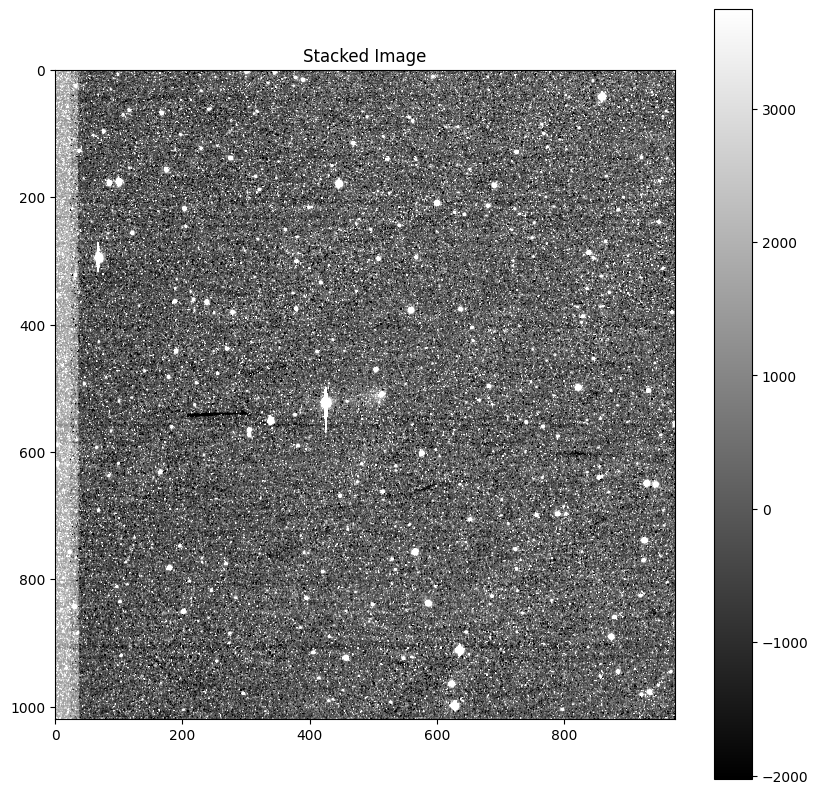

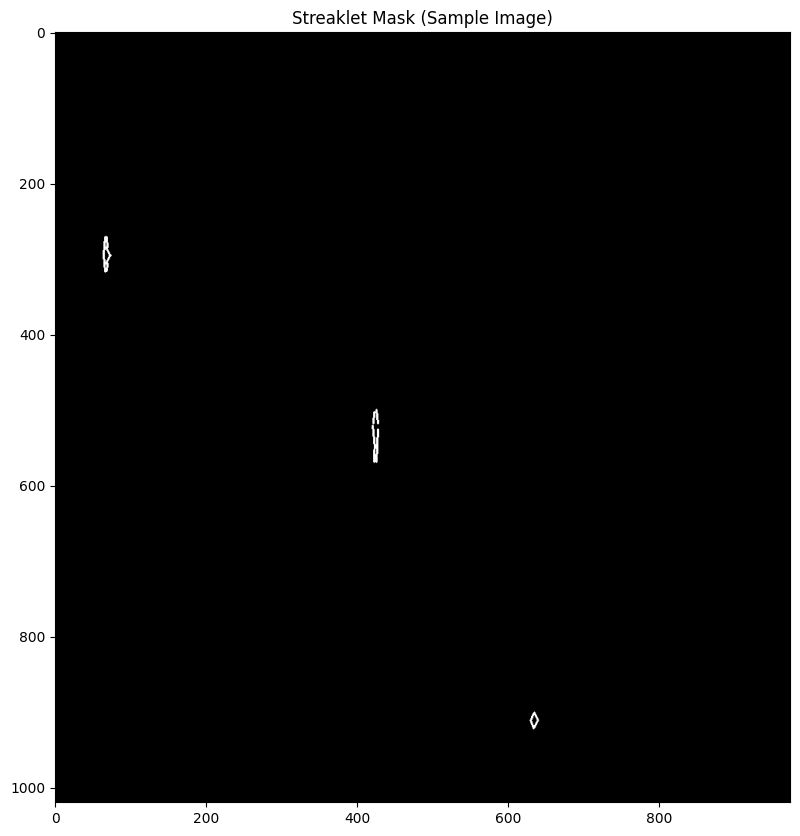

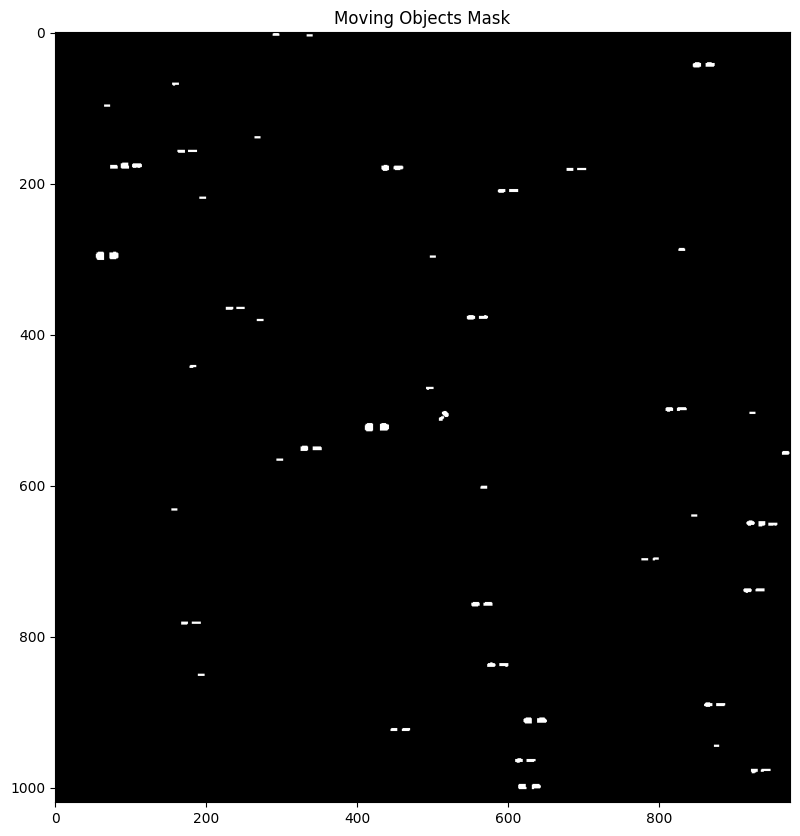

In [30]:
# Visualize the results
visualize_results(stacked_image, streaklet_masks, moving_objects_mask)


In [31]:
def create_gif(image_files, image_directory, output_path, duration=0.5):
    frames = []
    for filename in tqdm(image_files, desc='Creating GIF'):
        filepath = os.path.join(image_directory, filename)
        data = read_fits_data(filepath)

        # Normalize the image data for visualization
        vmin, vmax = np.percentile(data, [5, 95])
        normalized_data = np.clip((data - vmin) / (vmax - vmin), 0, 1)

        # Convert to 8-bit grayscale image
        image_8bit = (normalized_data * 255).astype(np.uint8)

        # Append the image to the frames list
        frames.append(image_8bit)

    # Save the frames as an animated GIF and set loop to 0 for infinite looping
    imageio.mimsave(output_path, frames, format='GIF', duration=duration, loop=0)
    print(f"Animated GIF saved to {output_path}")


In [32]:
# Define the output path for the GIF
gif_output_path = os.path.join(output_directory, 'animated_images.gif')

# Create the GIF
create_gif(image_files, output_directory, gif_output_path, duration=0.5)


Creating GIF: 100%|██████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 13.92it/s]


Animated GIF saved to neossat_example_results\animated_images.gif


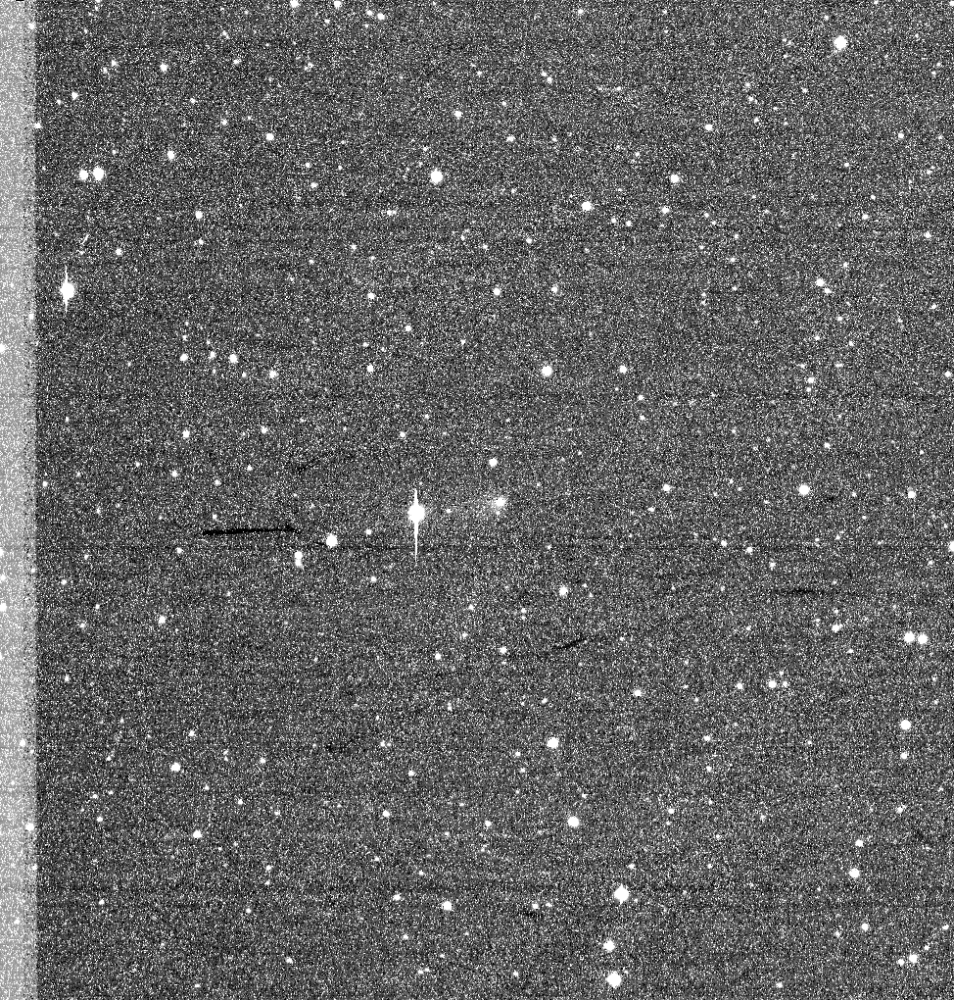

In [33]:
# Display the GIF
Image(filename=gif_output_path)


## Interpreting Results

From the above images, we can see that a lot of motion was detected between image frames. This is partly because no drift-correction was applied between image stacks resulting in a horizontal shift of objects. However, for our object of interest, we can see diagonal movement between points. Processing the ["optical-flow"](https://docs.opencv.org/3.4/d4/dee/tutorial_optical_flow.html) and the direction of vectors can be one technique in determining objects of interest. 

Additionally, it is worth noting, that in other image series, you may encounter larger streaklets. These will be large lines across the image and are typically only viewable in a single frame. These represent high-speed objects passing in front of the sensor such as space-debris or nearby satellites.


## Congratulations! 

You now have processed NEOSSat data. This is a complex dataset, with many ways of processing. So, we recommend you continue exploring this dataset and finding new and exciting ways of detecting and tracking near-earth-objects. 

The NEOSSat dataset can also be used to create other valuable data products, such as lightcurve diagrams. These diagrams are crucial for exoplanet detection and analysis, as they track variations in a star’s brightness over time, helping to identify potential exoplanet transits.